# DETR

Обучим модель DETR, пользуясь PyTorch и Tensorboard 

## Создаем окружение, подгружаем библиотеки

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

In [2]:
!pip install -q pytorch-lightning

In [3]:
!pip install pickleshare

## Загрузка и предобработка данных

Здесь мы загружаем пример набора данных, размещенный на Github.

In [4]:
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

"wget" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


Аннотации данного датасета, которые содержат информацию о том, где находятся
искомые нами на изображении объекты, представлены в VIA формате, однако
`YolosFeatureExtractor` работает с аннотациями в COCO формате, поэтому надо
осуществить преобразование.

Из формата VIA это можно сделать с помощью конкретного инструмента

In [5]:
!git clone https://github.com/woctezuma/VIA2COCO
%cd VIA2COCO/
!git checkout fixes

c:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO


fatal: destination path 'VIA2COCO' already exists and is not an empty directory.


Your branch is up to date with 'origin/fixes'.


Already on 'fixes'


In [20]:
from VIA2COCO import convert

In [52]:
data_path = '../balloon/'

first_class_index = 0

for keyword in ['train', 'val']:

  input_dir = data_path + keyword + '/'
  input_json = input_dir + 'via_region_data.json'
  # input_dir = '../balloon/train/'
  # input_json = '../balloon/train/via_region_data.json'
  categories = ['balloon']
  super_categories = ['N/A']
  output_json = input_dir + 'custom_' + keyword + '.json'

  print('Конвертируем {} из VIA формата в COCO формат'.format(input_json))

  coco_dict = convert.convert(
      imgdir=input_dir,
      annpath=input_json,
      categories=categories,
      super_categories=super_categories,
      output_file_name=output_json,
      first_class_index=first_class_index,
  )

Конвертируем ../balloon/train/via_region_data.json из VIA формата в COCO формат
Saving to ../balloon/train/custom_train.json
Конвертируем ../balloon/val/via_region_data.json из VIA формата в COCO формат
Saving to ../balloon/val/custom_val.json


## Создаем PyTorch dataset и dataloaders

Здесь мы определяем обычный dataset PyTorch. Каждый элемент набора данных
представляет собой изображение и соответствующие аннотации. Torchvision уже
предоставляет набор данных CocoDetection, который можно использовать. Мы
добавляем экстрактор признаков («YolosFeatureExtractor») только для изменения
размера и нормализации изображений и для преобразования аннотаций (которые
находятся в формате COCO) в формат, ожидаемый DETR (DEtection TRansformer). Он
также соответствующим образом изменит размер аннотаций.

In [53]:
import torchvision
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # считывание изображения и ожидаемого ответа (лейбл или target) в формат COCO
        img, target = super(CocoDetection, self).__getitem__(idx)

        # обработать изображение и таргет (привести target к формату DETR,
        # изменить размер, нормализовать)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # удалить размер batch
        target = encoding["labels"][0] # удалить размер batch

        return pixel_values, target

На основе определенного выше класса мы создаем наборы данных для обучения и проверки.

In [7]:
!pip install pycocotools

   ---------------------------------------- 0.0/85.1 kB ? eta -:--:--
   -------------- ------------------------- 30.7/85.1 kB 1.3 MB/s eta 0:00:01
   ------------------- -------------------- 41.0/85.1 kB 393.8 kB/s eta 0:00:01
   ---------------------------------------- 85.1/85.1 kB 796.8 kB/s eta 0:00:00


In [55]:
from transformers import AutoFeatureExtractor

feature_extractor = AutoFeatureExtractor.from_pretrained("hustvl/yolos-small", size=512, max_size=864)

train_dataset = CocoDetection(img_folder=data_path + '/train', feature_extractor=feature_extractor)
val_dataset = CocoDetection(img_folder=data_path + '/val', feature_extractor=feature_extractor, train=False)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


Как можно заметить, этот датасет небольшой:

In [56]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))

Number of training examples: 61
Number of validation examples: 13


Давайте визуализируем пример. Мы можем получить доступ к COCO API набора данных,
используя ''train_dataset.coco''.

Image: 8


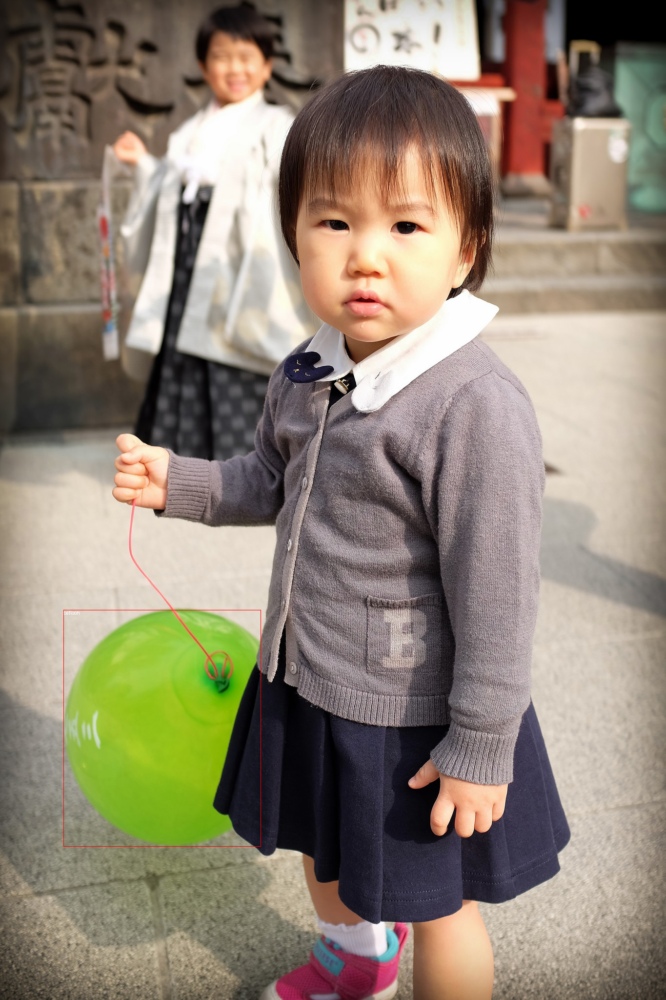

In [58]:
import numpy as np
import os
from PIL import Image, ImageDraw

# используя
# https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()

image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image: {}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join(data_path + '/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Теперь сделаем соответствующие dataloader'ы. Мы определяем собственный
`collate_fn` для создания батчей изображений. Поскольку DETR изменяет размеры
изображений до минимального размера 800 и максимального размера 1333,
изображения могут иметь разные размеры. Будем дополнять изображения
(''pixel_values'') до самого большого изображения в батче.

In [59]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = feature_extractor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=1, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=1)
batch = next(iter(train_dataloader))

Давайте проверим ключи одного батча:

In [60]:
batch.keys()

dict_keys(['pixel_values', 'labels'])

Проверим размерность `pixel_values` и проверим `target`:

In [61]:
pixel_values, target = train_dataset[0]

In [39]:
pixel_values.shape

torch.Size([3, 512, 672])

In [40]:
print(target)

{'size': tensor([512, 672]), 'image_id': tensor([0]), 'class_labels': tensor([0]), 'boxes': tensor([[0.5955, 0.5811, 0.2202, 0.3561]]), 'area': tensor([1485.3125]), 'iscrowd': tensor([0]), 'orig_size': tensor([1536, 2048])}


## Обучим модель с помощью PyTorch Lightning

Определим `LightningModule`, что-то типа `nn.Module` с некоторыми
дополнительными функциями.

In [41]:
import pytorch_lightning as pl
from transformers import DetrConfig, AutoModelForObjectDetection
import torch

In [62]:
class Detr(pl.LightningModule):
     def __init__(self, lr, weight_decay):
         super().__init__()

         self.model = AutoModelForObjectDetection.from_pretrained("hustvl/yolos-small",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         self.lr = lr
         self.weight_decay = weight_decay

     def forward(self, pixel_values):
       outputs = self.model(pixel_values=pixel_values)

       return outputs

     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.lr,
                                  weight_decay=self.weight_decay)

        return optimizer

     def train_dataloader(self):
        return train_dataloader

     def val_dataloader(self):
        return val_dataloader

Поскольку PyTorch Lightning по умолчанию логирует в Tensorboard, попробуем его
открыть:

In [43]:
!pip install -U torch-tb-profiler

   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   - -------------------------------------- 0.0/1.1 MB 1.3 MB/s eta 0:00:01
   - -------------------------------------- 0.0/1.1 MB 1.3 MB/s eta 0:00:01
   ---- ----------------------------------- 0.1/1.1 MB 930.9 kB/s eta 0:00:02
   ------ --------------------------------- 0.2/1.1 MB 893.0 kB/s eta 0:00:01
   --------- ------------------------------ 0.2/1.1 MB 1.3 MB/s eta 0:00:01
   ------------- -------------------------- 0.4/1.1 MB 1.3 MB/s eta 0:00:01
   -------------- ------------------------- 0.4/1.1 MB 1.3 MB/s eta 0:00:01
   ------------------------ --------------- 0.6/1.1 MB 1.7 MB/s eta 0:00:01
   ----------------------------- ---------- 0.8/1.1 MB 2.0 MB/s eta 0:00:01
   ---------------------------------------- 1.1/1.1 MB 2.5 MB/s eta 0:00:00


In [63]:
# Используем tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2680), started 0:12:49 ago. (Use '!kill 2680' to kill it.)

Определим модель и проверим выходные данные.

In [67]:
model = Detr(lr=2.5e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'])

Some weights of YolosForObjectDetection were not initialized from the model checkpoint at hustvl/yolos-small and are newly initialized because the shapes did not match:
- class_labels_classifier.layers.2.weight: found shape torch.Size([92, 384]) in the checkpoint and torch.Size([2, 384]) in the model instantiated
- class_labels_classifier.layers.2.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Дальше - обучение! При обучении будем использовать градиентное отсечение
(gradient clipping). Можно использовать Tensorboard для отслеживания значения
функции потерь.

In [68]:
from pytorch_lightning import Trainer

trainer = Trainer(accelerator='auto', max_steps=2000, gradient_clip_val=0.1, accumulate_grad_batches=4)
trainer.fit(model)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



  | Name  | Type                    | Params
--------------------------------------------------
0 | model | YolosForObjectDetection | 30.7 M
--------------------------------------------------
30.7 M    Trainable params
0         Non-trainable params
30.7 M    Total params
122.600   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=2000` reached.


## Подсчёт метрик

Наконец, оценим модель на val наборе. В исходном репозитории DETR есть несколько
хороших инструментов оценки, которые можно использовать.

Они основаны на классе `CocoEvaluator` из torchvision

In [69]:
!git clone https://github.com/facebookresearch/detr.git

Cloning into 'detr'...


In [70]:
%cd detr

c:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO\detr


C:\Users\david\AppData\Roaming\Python\Python39\site-packages\IPython\core\magics\osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [71]:
from detr.datasets import get_coco_api_from_dataset

base_ds = get_coco_api_from_dataset(val_dataset)

In [72]:
from datasets.coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

iou_types = ['bbox']
coco_evaluator = CocoEvaluator(base_ds, iou_types)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)
model.eval()

Detr(
  (model): YolosForObjectDetection(
    (vit): YolosModel(
      (embeddings): YolosEmbeddings(
        (patch_embeddings): YolosPatchEmbeddings(
          (projection): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (interpolation): InterpolateInitialPositionEmbeddings()
      )
      (encoder): YolosEncoder(
        (layer): ModuleList(
          (0-11): 12 x YolosLayer(
            (attention): YolosAttention(
              (attention): YolosSelfAttention(
                (query): Linear(in_features=384, out_features=384, bias=True)
                (key): Linear(in_features=384, out_features=384, bias=True)
                (value): Linear(in_features=384, out_features=384, bias=True)
                (dropout): Dropout(p=0.0, inplace=False)
              )
              (output): YolosSelfOutput(
                (dense): Linear(in_features=384, out_features=384, bias=True)
                (dropout): Dropo

In [73]:
!pip install ipywidgets

In [74]:
!jupyter nbextension enable --py widgetsnbextension

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

optional arguments:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: console dejavu events execute kernel kernelspec lab
labextension labhub migrate nbconvert notebook qtconsole run server
troubleshoot trust

Jupyter command `jupyter-nbextension` not found.


In [75]:
!pip install jupyter_contrib_nbextensions

     ---------------------------------------- 0.0/23.5 MB ? eta -:--:--
     ---------------------------------------- 0.0/23.5 MB 1.3 MB/s eta 0:00:19
     --------------------------------------- 0.1/23.5 MB 648.1 kB/s eta 0:00:37
     --------------------------------------- 0.1/23.5 MB 930.9 kB/s eta 0:00:26
     ---------------------------------------- 0.2/23.5 MB 1.3 MB/s eta 0:00:18
     ---------------------------------------- 0.3/23.5 MB 1.3 MB/s eta 0:00:19
      --------------------------------------- 0.4/23.5 MB 1.4 MB/s eta 0:00:17
      --------------------------------------- 0.5/23.5 MB 1.7 MB/s eta 0:00:14
     - -------------------------------------- 0.7/23.5 MB 2.0 MB/s eta 0:00:12
     -- ------------------------------------- 1.2/23.5 MB 2.9 MB/s eta 0:00:08
     --- ------------------------------------ 1.8/23.5 MB 4.0 MB/s eta 0:00:06
     ---- ----------------------------------- 2.5/23.5 MB 4.9 MB/s eta 0:00:05
     ------ --------------------------------- 3.8/23.5 MB

In [76]:
%cd ..

c:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO


In [77]:
print("Запуск оценки...")

for idx, batch in enumerate(tqdm(val_dataloader)):
    pixel_values = batch["pixel_values"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]]

    outputs = model.model(pixel_values=pixel_values)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = feature_extractor.post_process(outputs, orig_target_sizes)
    res = {target['image_id'].item(): output for target, output in zip(labels, results)}
    coco_evaluator.update(res)

coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

Запуск оценки...


  0%|          | 0/13 [00:00<?, ?it/s]

`post_process` is deprecated and will be removed in v5 of Transformers, please use `post_process_object_detection` instead, with `threshold=0.` for equivalent results.


Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.417
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.640
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.428
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.630
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.156
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.484
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.546
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.717
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= l

## Использование и визуализация

Визуализируем предсказания DETR на некотором изображении из val.

In [78]:
pixel_values, target = val_dataset[1]

In [79]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 672, 512])


In [80]:
outputs = model(pixel_values=pixel_values)

In [82]:
import torch
import matplotlib.pyplot as plt

COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{id2label[cl.item()]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [83]:
def visualize_predictions(image, outputs, threshold=0.9):
  # визуализировать рамки для предсказаний, которые выше порогового значения
  probas = outputs.logits.softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  # конветировать рамки предсказаний для конкретного изображения
  bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

  plot_results(image, probas[keep], bboxes_scaled)

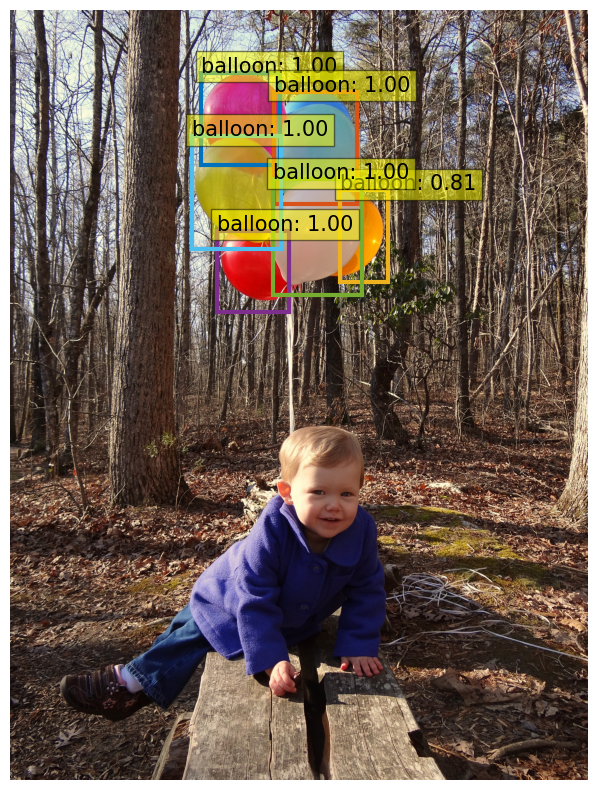

In [85]:
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('../balloon/val', image['file_name']))

visualize_predictions(image, outputs, threshold=0.5)

P.S. На данном этапе модель не обучена... Постарайся получить результаты получше :)

# Yolo

## Установка

In [86]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...


In [87]:
!pip install utils

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for utils: filename=utils-1.0.2-py2.py3-none-any.whl size=13956 sha256=117a174c5a78dfd9f4044c1f7279d55aac6ee93919ec2f2efd25239593c5c8dd
  Stored in directory: c:\users\david\appdata\local\pip\cache\wheels\4c\a5\a3\ab48e06c936b39960801612ee2767ff53764119f33d3d646e7
Successfully built utils


In [88]:
%cd yolov5
%pip install -qr requirements.txt comet_ml

import torch
import utils
display = utils.notebook_init()

YOLOv5  v7.0-295-gac6c4383 Python-3.9.11 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)


Setup complete  (16 CPUs, 31.9 GB RAM, 495.6/759.6 GB disk)


## 1. Применение

`detect.py` выполняет вывод YOLOv5 на различных источниках, автоматически
загружая модели с последнего релиза YOLO, и сохраняя результаты в runs/detect.
Примеры источников вывода:


```shell
python detect.py --source 0  # webcam
                          img.jpg  # image
                          vid.mp4  # video
                          screen  # screenshot
                          path/  # directory
                         'path/*.jpg'  # glob
                         'https://youtu.be/LNwODJXcvt4'  # YouTube
                         'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP stream
```

In [89]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov5s.pt'], source=data/images, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-295-gac6c4383 Python-3.9.11 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)


  0%|          | 0.00/14.1M [00:00<?, ?B/s]
  1%|          | 80.0k/14.1M [00:00<00:17, 818kB/s]
  2%|▏         | 240k/14.1M [00:00<00:12, 1.20MB/s]
  3%|▎         | 448k/14.1M [00:00<00:08, 1.60MB/s]
  8%|▊         | 1.14M/14.1M [00:00<00:03, 3.62MB/s]
 18%|█▊        | 2.61M/14.1M [00:00<00:01, 7.54MB/s]
 39%|███▊      | 5.46M/14.1M [00:00<00:00, 14.8MB/s]
 57%|█████▋    | 8.08M/14.1M [00:00<00:00, 13.0MB/s]
 90%|█████████ | 12.8

In [90]:
pth ="../"

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;
<img align="left" src="https://user-images.githubusercontent.com/26833433/127574988-6a558aa1-d268-44b9-bf6b-62d4c605cc72.jpg" width="600">

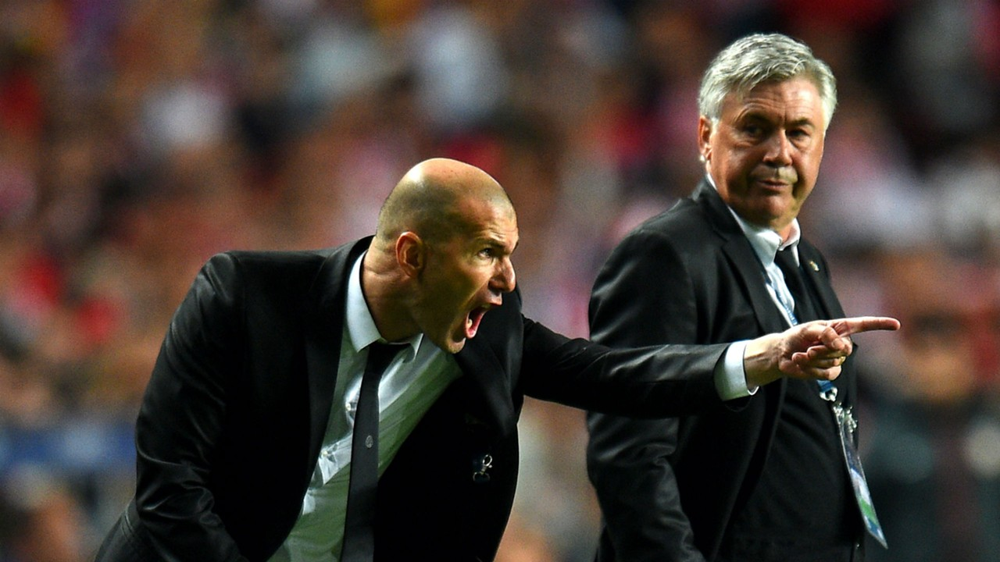

In [91]:
display.Image(filename=pth+'yolov5\\data\\images\\zidane.jpg', width=600)

## 2. Валидация
Проверить точность модели на наборе данных COCO на выборках val или test. Модели
загружаются автоматически из последнего релиза YOLOv5. Чтобы отобразить
результаты по классам, используйте флаг `--verbose`.

In [92]:
# Download COCO val
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')  # download (780M - 5000 images)
!unzip -q tmp.zip -d ../datasets && rm tmp.zip  # unzip

100%|██████████| 780M/780M [00:45<00:00, 17.8MB/s] 
"unzip" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


In [98]:
# Validate YOLOv5s on COCO val
!python val.py --weights yolov5s.pt --data coco.yaml --img 640 --half

loading annotations into memory...
Done (t=0.34s)
creating index...
index created!
Loading and preparing results...
DONE (t=3.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=30.27s).
Accumulating evaluation results...
DONE (t=7.52s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.374
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.572
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.491
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.311
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.516
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDet

val: data=C:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO\yolov5\data\coco.yaml, weights=['yolov5s.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=True, project=runs\val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5  v7.0-295-gac6c4383 Python-3.9.11 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs

val: Scanning C:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO\datasets\coco\val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
val: Scanning C:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\VIA2COCO\datasets\coco\val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]

## 3. Обучение

Обучите модель YOLOv5s на наборе данных COCO128 с использованием `--data
coco128.yaml`, начиная с предварительно обученных весов `--weights yolov5s.pt`,
либо с случайно инициализированными `--weights '' --cfg yolov5s.yaml`.

- Предварительно обученные модели загружаются автоматически из последнего релиза
  YOLOv5.
- Наборы данных, доступные для автоматической загрузки, включают: [COCO](https://github.com/ultralytics/yolov5/blob/master/data/coco.yaml), [COCO128](https://github.com/ultralytics/yolov5/blob/master/data/coco128.yaml), [VOC](https://github.com/ultralytics/yolov5/blob/master/data/VOC.yaml), [Argoverse](https://github.com/ultralytics/yolov5/blob/master/data/Argoverse.yaml), [VisDrone](https://github.com/ultralytics/yolov5/blob/master/data/VisDrone.yaml), [GlobalWheat](https://github.com/ultralytics/yolov5/blob/master/data/GlobalWheat2020.yaml), [xView](https://github.com/ultralytics/yolov5/blob/master/data/xView.yaml), [Objects365](https://github.com/ultralytics/yolov5/blob/master/data/Objects365.yaml), [SKU-110K](https://github.com/ultralytics/yolov5/blob/master/data/SKU-110K.yaml)
- Результаты обучения сохраняются в `runs/train/` с увеличивающимися номерами
директорий, например, `runs/train/exp2`, `runs/train/exp3` и так далее.

Для обучения используется dataloader **Mosaic**, который объединяет 4
изображения в одно мозаичное изображение.

### Roboflow

[Roboflow](https://roboflow.com/?ref=ultralytics) позволяет вам легко
**организовывать, размечать и подготавливать набор данных** высокого качества с
вашими собственными данными. Roboflow также упрощает настройку конвейера
активного обучения, сотрудничество с вашей командой по улучшению набора данных и
интеграцию напрямую в рабочий процесс построения модели с помощью пакета pip
`roboflow`.

https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data

In [95]:
!pip3 freeze > requirements.txt 

In [99]:
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --cache 

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-295-gac6c4383 Python-3.9.11 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_p

In [102]:
!python detect.py --source C:/Users/david/Desktop/vsCodeProject/ComputerVision/29march/korgi.jpg --weights C:/Users/david/Desktop/vsCodeProject/ComputerVision/29march/VIA2COCO/yolov5/runs/train/exp/weights/best.pt --img-size 640 --conf 0.4

detect: weights=['C:/Users/david/Desktop/vsCodeProject/ComputerVision/29march/VIA2COCO/yolov5/runs/train/exp/weights/best.pt'], source=C:/Users/david/Desktop/vsCodeProject/ComputerVision/29march/korgi.jpg, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-295-gac6c4383 Python-3.9.11 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070, 12282MiB)

Fusing layers... 
Model summary: 157 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 C:\Users\david\Desktop\vsCodeProject\ComputerVision\29march\korgi.jpg: 448x640 5 dogs, 65.0ms
Speed: 1.0ms pre-process, 65.0ms inference, 52.0ms NMS per image at shape (1, 3, 640, 6

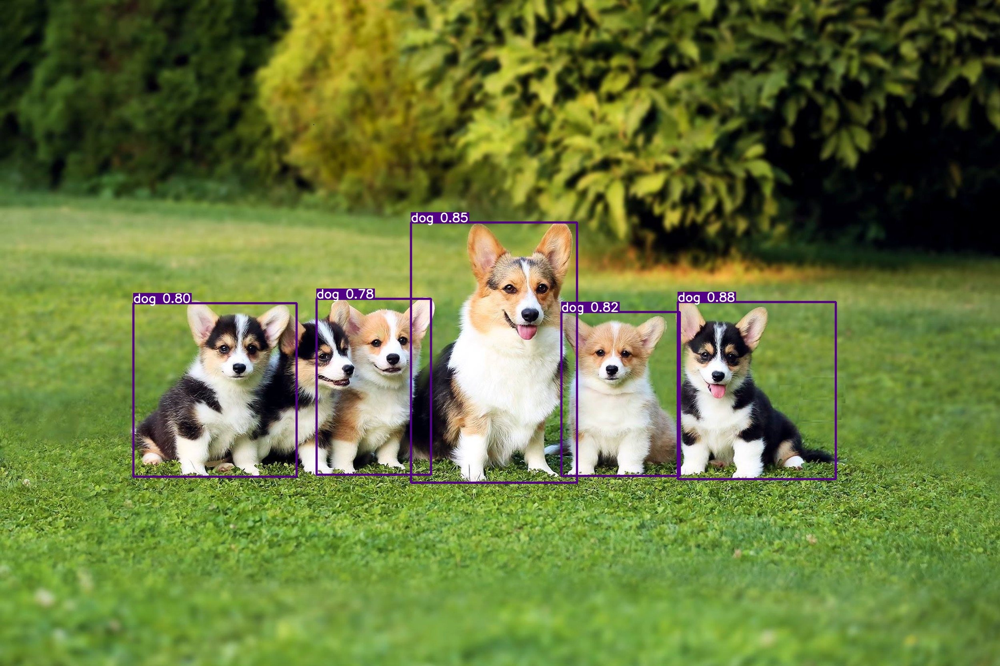

In [105]:
display.Image(filename="C:/Users/david/Desktop/vsCodeProject/ComputerVision/29march/VIA2COCO/yolov5/runs/detect/exp3/korgi.jpg", width=1000)